<a href="https://www.kaggle.com/code/subhadipde2000/waste-classification-with-efficientnetv2?scriptVersionId=195212740" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction:

In the realm of environmental sustainability, waste management is a critical challenge that necessitates innovative solutions. One of the key aspects of effective waste management is the accurate classification of different types of waste. This classification enables efficient recycling, disposal, and resource recovery processes. Traditional methods of waste classification often rely on manual sorting, which is labor-intensive and prone to human error.

To address these issues, this project aims to leverage the power of computer vision and deep learning to develop an automated waste classification system. By utilizing a dataset of 15,000 images, divided into two categories—default (studio images) and real-world (images of waste in natural settings)—we aim to train a robust model capable of accurately identifying various types of waste.

# Problem Statement:

The primary objective of this project is to build a computer vision model that can classify different types of waste with high accuracy. The dataset consists of 15,000 images, categorized into two distinct groups:
1. **Default Images**: These are studio images of waste, which are clean and clear, providing a controlled environment for training the model.
2. **Real-World Images**: These images capture waste in its natural setting, introducing variability and complexity that the model must learn to handle.

To achieve this, the project will involve several key steps:
1. **Image Preprocessing**: Enhancing the quality and consistency of the images to improve the model's performance.
2. **Image Augmentation**: Generating additional training data by applying various transformations to the existing images, thereby increasing the model's robustness.
3. **Model Fine-Tuning**: Utilizing the EfficientNetV2B3 model, a state-of-the-art convolutional neural network, and fine-tuning it to adapt to the specific characteristics of the waste classification task.

In [1]:
!nvidia-smi

Tue Sep  3 21:09:36 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P0             26W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Imports

In [2]:
import os
os.environ["KERAS_BACKEND"] = "jax"

import shutil
import keras
import random
import keras_cv
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.utils import image_dataset_from_directory

2024-09-03 21:09:45.382177: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-03 21:09:45.382313: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-03 21:09:45.523524: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
warnings.filterwarnings("ignore")

In [4]:
# Reproducability
tf.keras.utils.set_random_seed(42)

# Exploring the working directory

In [5]:
# Creating a list of directories of all image categories in /kaggle/input/

waste_type_dir = []

for (root, dirs, files) in os.walk('/kaggle/input'):
    if root.split('/')[-3:-1] == ['images', 'images']:
        waste_type_dir.append(root)
        
waste_type_dir.sort()
waste_type_dir[:5]

['/kaggle/input/recyclable-and-household-waste-classification/images/images/aerosol_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/aluminum_food_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/aluminum_soda_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/cardboard_boxes',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/cardboard_packaging']

# Creating the training, validation and testing directories

In [6]:
# Defining the paths for training, validation, test directories
train_dir = '/kaggle/working/training-images/'
valid_dir = '/kaggle/working/validation-images/'
test_dir = '/kaggle/working/test-images/'

In [7]:
# Creating the directories for training and test images and also creating sub-directories of each waste category
for x in waste_type_dir:
    os.makedirs(train_dir + x.split('/')[-1], exist_ok=True)
    os.makedirs(valid_dir + x.split('/')[-1], exist_ok=True)
    os.makedirs(test_dir + x.split('/')[-1], exist_ok=True)

# Exploratory Data Analysis

In [8]:
# Creating a dataframe of waste categories and the corressponding number of images in each category

num_images_dict = {'waste_category': [x.split('/')[-1] for x in waste_type_dir],
             'num_images': [(len(os.listdir(x + '/default')) + len(os.listdir(x + '/real_world'))) for x in waste_type_dir],
             'num_default_images': [len(os.listdir(x + '/default')) for x in waste_type_dir],
             'num_real_world_images': [len(os.listdir(x + '/real_world')) for x in waste_type_dir]}

num_images_df = pd.DataFrame.from_dict(num_images_dict)

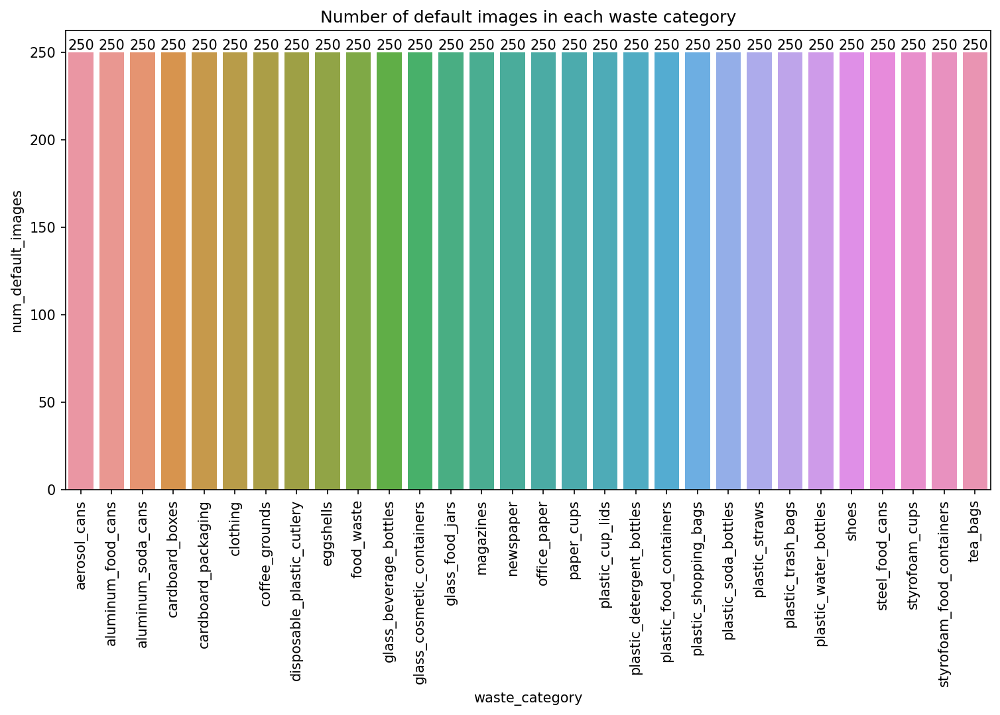

In [9]:
plt.figure(figsize=(12, 6), dpi=150)
plt.title("Number of default images in each waste category")
plt.xticks(rotation=90)
ax = sns.barplot(num_images_df, x='waste_category', y='num_default_images')
ax.bar_label(ax.containers[0], fontsize=10);

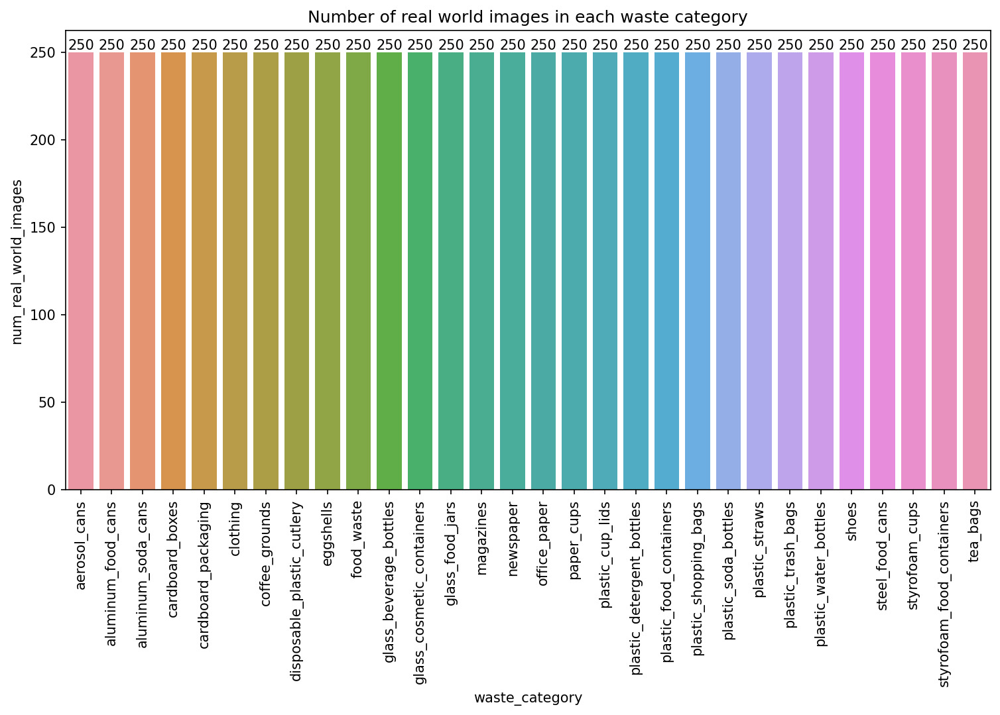

In [10]:
plt.figure(figsize=(12, 6), dpi=150)
plt.title("Number of real world images in each waste category")
plt.xticks(rotation=90)
ax = sns.barplot(num_images_df, x='waste_category', y='num_real_world_images')
ax.bar_label(ax.containers[0], fontsize=10);

In [11]:
# Function for plotting 2 random images from a folder

def plot_random_images_from_directory(directory_path):
    
    all_files = os.listdir(directory_path) 
    
    if len(all_files) < 4:
        print("Not enough images in the directory to display.")
        return
    
    selected_images = random.sample(all_files, 2)
    fig, axes = plt.subplots(1, 2, figsize=(6, 3), dpi=100)
    
    for i, ax in enumerate(axes.flat):
        image_path = os.path.join(directory_path, selected_images[i])
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        
    class_name = os.path.basename(directory_path)
    fig.suptitle(directory_path.split('/')[-2] + ': ' + class_name, fontsize=16)
    plt.tight_layout()
    plt.show()

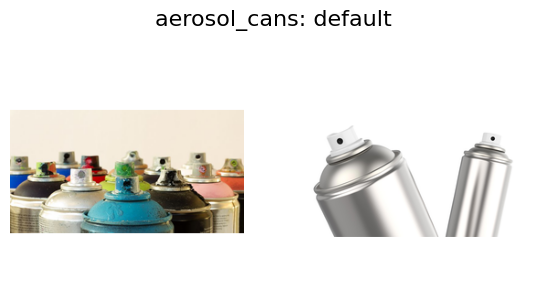

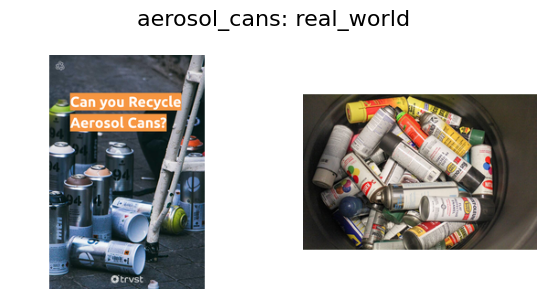

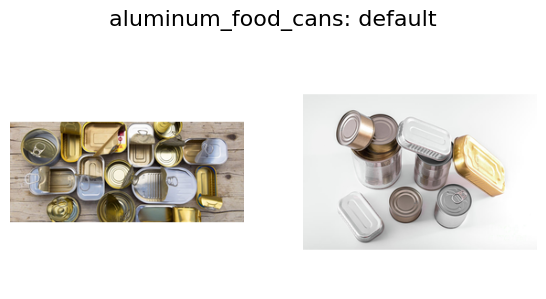

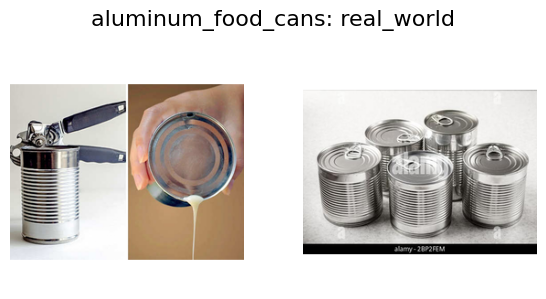

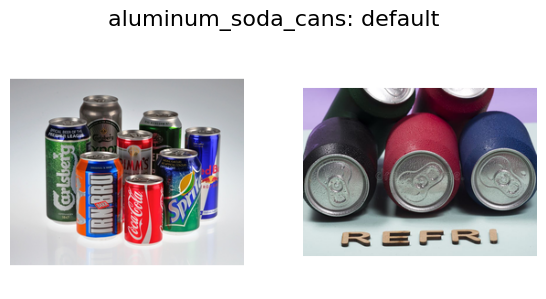

...

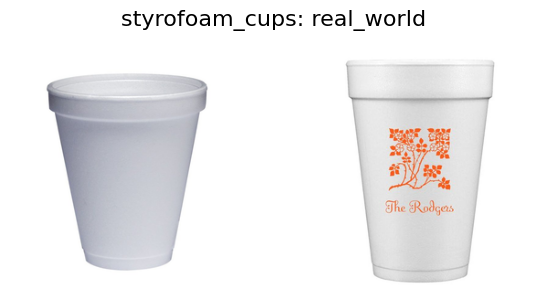

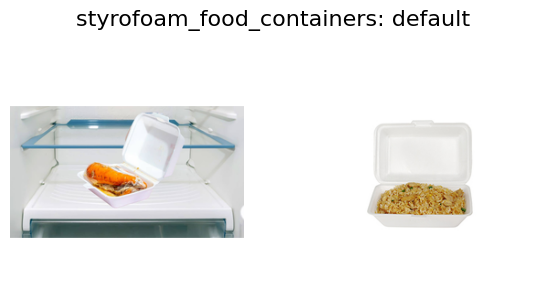

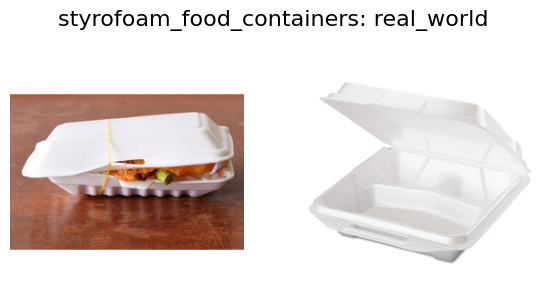

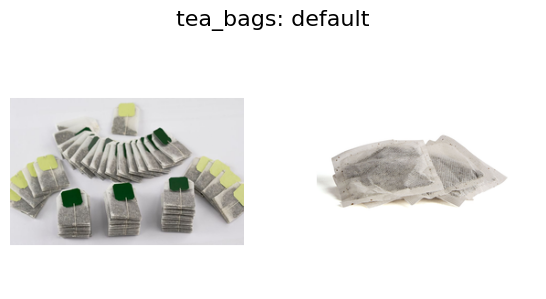

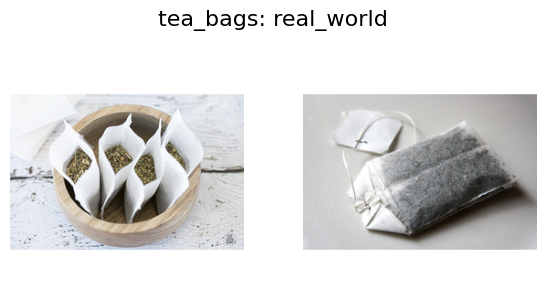

In [12]:
# Visualizing 2 random default and real_world images of every waste category

for directory in waste_type_dir:
    plot_random_images_from_directory(directory + '/default')
    plot_random_images_from_directory(directory + '/real_world')

# Moving the images

In [13]:
# Creating a list of all image paths in /kaggle/input/

file_paths = []

for directory in waste_type_dir:
    for root, dirs, files in os.walk(directory):
        if root.split('/')[-1] == 'default' or root.split('/')[-1] == 'real_world':
            paths = os.listdir(root)
            for path in paths:
                file_paths.append(os.path.join(root, path))
                
file_paths.sort()

len(file_paths), len(set(file_paths)) # Checking if the list has any duplicate file paths

(15000, 15000)

In [14]:
# Copyling all the images to the sub-directories of /kaggle/working/training-images/ according to their waste category

num=0
for src in file_paths:
    fn = src.split('/')[-1]
    dst = train_dir + src.split('/')[-3] + '/'
    if fn not in os.listdir(dst):
        shutil.copy(src, dst)
        num+=1
    elif fn in os.listdir(dst):
        new_fn = 'Image_' + str(250 + int(fn.split('_')[-1].split('.')[0])) + '.png'
        shutil.copy(src, dst + new_fn)
        num+=1

print(f"Fininshed copying {num} images.")

Fininshed copying 15000 images.


* Now, we will move 50 images of each waste category from the training-images directory to the validation-images and test-images directory
* After this, the training-images directory should have 12000 images, and the validation-images & test-images directory should have 1500 images each

In [15]:
# Moving 50 images of each waste category from the training-images directory to the validation-images and test-images directory

for root, dirs, files in os.walk('/kaggle/working/training-images'):
    if root.split('/')[-1] != 'training-images':
        for i in range(50):
            src_path_test = os.path.join(root, random.choice(os.listdir(root)))
            dst_path_test = '/kaggle/working/test-images/' + root.split('/')[-1]
            shutil.move(src_path_test, dst_path_test)
            src_path_valid = os.path.join(root, random.choice(os.listdir(root)))
            dst_path_valid = '/kaggle/working/validation-images/' + root.split('/')[-1]
            shutil.move(src_path_valid, dst_path_valid)

# Building tensorflow image datasets

In [16]:
def build_img_dataset(directory, BATCH_SIZE=64, SEED=101, IMG_SIZE=(256, 256), class_names=False, shuffle=True):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory=directory,
        batch_size=BATCH_SIZE,
        label_mode='categorical',
        image_size=IMG_SIZE,
        interpolation='lanczos5',
        shuffle=shuffle,
        seed=SEED
    )
    
    class_names = dataset.class_names
    
    dataset = dataset.cache().prefetch(tf.data.AUTOTUNE)
    
    return (dataset, class_names if class_names else None)

In [17]:
train_data = build_img_dataset(train_dir)[0]
valid_data = build_img_dataset(valid_dir)[0]
test_data, test_classes = build_img_dataset(test_dir, class_names=True) # will need test_classes in visualizing predictions

Found 12000 files belonging to 30 classes.
Found 1500 files belonging to 30 classes.
Found 1500 files belonging to 30 classes.


# Image Augmentations

In [18]:
def pack_to_dict(image, label):
    return {"images": image, "labels": label}

train_data = train_data.map(pack_to_dict, num_parallel_calls=tf.data.AUTOTUNE)

### Creating and applying image augmentation function

In [19]:
random_augment = keras_cv.layers.RandAugment(
    augmentations_per_image=5,
    value_range=(0, 255),
    magnitude=0.5,
    magnitude_stddev=0.15,
    rate=1.0,
)

cut_mix = keras_cv.layers.CutMix()
mix_up = keras_cv.layers.MixUp()
random_flip = keras_cv.layers.RandomFlip()
grid_mask = keras_cv.layers.GridMask()
augmenters = []
augmenters += [random_augment, random_flip, cut_mix, mix_up, grid_mask]

def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs
    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)
train_data = train_data.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

### Visualizing the augmented images

In [20]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

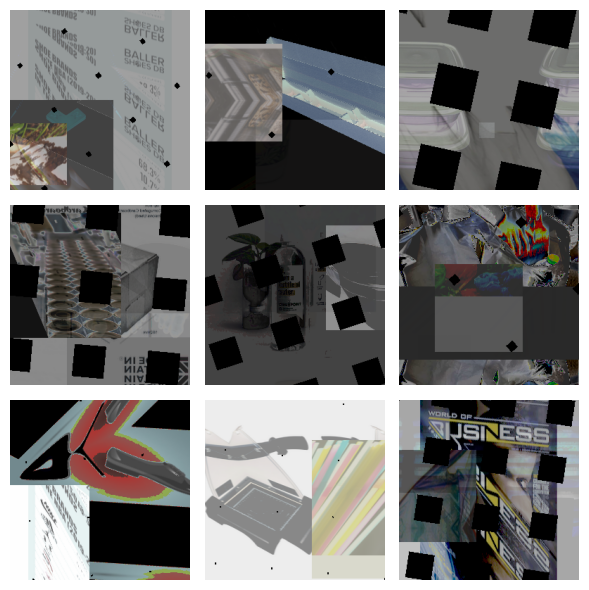

In [21]:
image_batch = next(iter(train_data.take(1)))["images"]
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

In [22]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]

train_data = train_data.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

# Modelling

In [23]:
base_model = tf.keras.applications.EfficientNetV2B3(
    include_top=False,
    input_shape=(256, 256, 3),
    pooling='avg',
    include_preprocessing=True
)

inputs = tf.keras.layers.Input(shape=(None, None, 3))
resized_inputs = tf.keras.layers.Resizing(256, 256)(inputs)
x = base_model(resized_inputs)
outputs = tf.keras.layers.Dense(len(test_classes), activation='softmax', name='output_layer')(x)
model = tf.keras.Model(inputs, outputs)

model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.AdamW(1e-4),
    metrics=['accuracy']
)

model.summary()

52606240/52606240 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resizing (Resizing)             │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b3 (Functional)  │ (None, 1536)           │    12,930,622 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 30)             │        46,110 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,976,732 (49.50 MB)

 Trainable params: 12,867,516 (49.09 MB)

 Non-trainable params: 109,216 (426.62 KB)

# Model training

In [24]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,
    mode='min',
    min_delta=0.01,
    verbose=1,
    restore_best_weights=True
)

In [25]:
history = model.fit(
    train_data,
    epochs=15,
    validation_data=valid_data,
    callbacks=[earlystopping],
)

Epoch 1/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 444s 2s/step - accuracy: 0.0797 - loss: 3.3550 - val_accuracy: 0.5233 - val_loss: 2.1038
Epoch 2/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 278s 1s/step - accuracy: 0.2488 - loss: 2.9331 - val_accuracy: 0.6947 - val_loss: 1.3069
Epoch 3/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 259s 1s/step - accuracy: 0.3226 - loss: 2.7106 - val_accuracy: 0.7520 - val_loss: 1.0139
Epoch 4/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 261s 1s/step - accuracy: 0.3605 - loss: 2.5931 - val_accuracy: 0.7827 - val_loss: 0.8736
Epoch 5/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 256s 1s/step - accuracy: 0.3921 - loss: 2.4989 - val_accuracy: 0.7933 - val_loss: 0.7939
Epoch 6/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 253s 1s/step - accuracy: 0.4073 - loss: 2.4391 - val_accuracy: 0.8120 - val_loss: 0.7106
Epoch 7/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 259s 1s/step - accuracy: 0.4125 - loss: 2.3824 - val_accuracy: 0.8253 - val_loss: 0.6725
Epoch 8/15
188/188 ━━━━━━━━━━━━━━━━━━━━ 253s 1s/step - accuracy: 0.4293 - loss: 2.3468 - val_accu

# Plotting the model accuracy and model loss

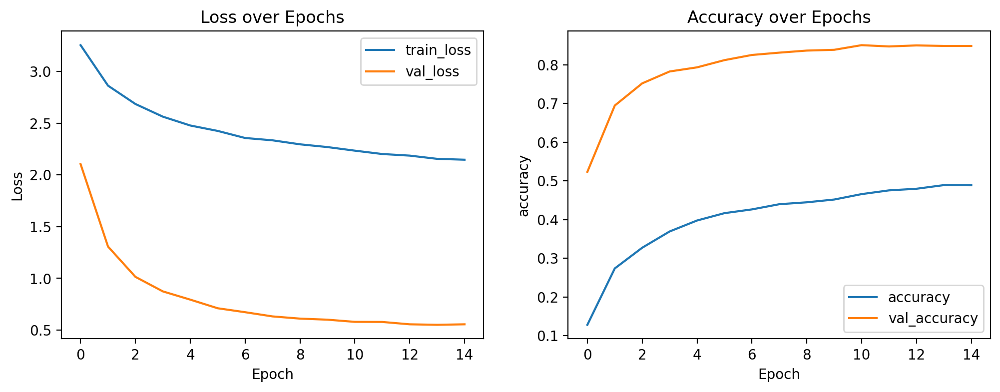

In [26]:
plt.figure(figsize=(12, 4), dpi=200)
# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.show();

# Model evaluation

In [27]:
loss, accuracy = model.evaluate(test_data)
print(f"The model loss on the test dataset is {round(loss, 4)}.")
print(f"The model accuracy on the test dataset is {round(accuracy, 2)*100}%.")

24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - accuracy: 0.8490 - loss: 0.5579
The model loss on the test dataset is 0.5765.
The model accuracy on the test dataset is 84.0%.


* We will now plot 9 random images from the test dataset along with their true and predcited labels
* If the predicted label matches the original label, the labels will be coloured in green, else, the labels will be coloured in red

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


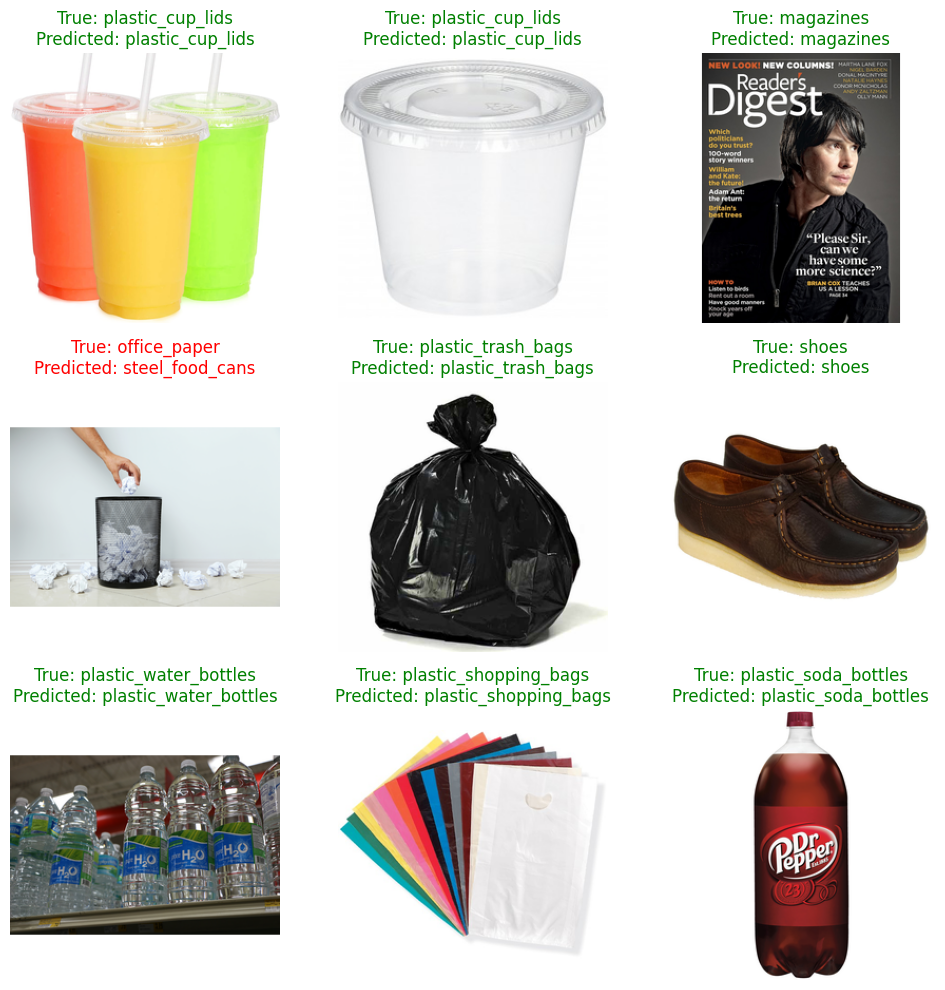

In [28]:
# Function to display a grid of images with predictions and true labels
def display_images_with_predictions_and_true_labels(dataset, model, test_classes, num_images=9):
    plt.figure(figsize=(10, 10))

    # Take a batch from the dataset and select random images
    for images, labels in dataset.take(1):
        indices = np.random.choice(images.shape[0], num_images, replace=False)
        random_images = images.numpy()[indices]
        true_labels = labels.numpy()[indices]
        
        # Convert true labels to integer indices if they are one-hot encoded
        if len(true_labels.shape) > 1:
            true_labels = np.argmax(true_labels, axis=1)

        predictions = model.predict(random_images)
        predicted_labels = np.argmax(predictions, axis=1)

        for i in range(num_images):
            plt.subplot(3, 3, i + 1)
            plt.imshow(random_images[i].astype("uint8"))
            if true_labels[i] == predicted_labels[i]:
                color = 'green'
            else:
                color = 'red'
            plt.title(f"True: {test_classes[true_labels[i]]}\nPredicted: {test_classes[predicted_labels[i]]}",
                      color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

display_images_with_predictions_and_true_labels(test_data, model, test_classes)